# Set up Environment

In [1]:
import scanpy as sc
import pandas as pd
import csv
import seaborn as sns
import copy
import numpy as np
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')

import logging, sys
logging.disable(sys.maxsize)

In [2]:
combined = sc.read('/scratch/qc_filtered_combined_samples.h5ad')

# Select the Cells of Interest

#### Before any further analysis we will exclude the cells that are neither CD8+ nor TCR+. First select the TCR and CD8 genes. #### Even though drop-out events are possible, it is extremely unlikely if drop-outs happen simultaneous for all 160 genes of a single cell. So by doing this we are almost 100% confident that we are subsetting all the T-cells, especially all of the CD8 T-cells

In [3]:
selected_genes = combined.var_names.str.startswith(("TRAV","TRAJ","TRBV","TRBD","TRBJ","CD8A","CD8B"))
CD8_related_genes = set(combined[:,selected_genes].var_names)

In [4]:
print("There are {} genes selected".format(len(CD8_related_genes)))

There are 168 genes selected


In [5]:
kept_cells = combined[:,'CD8A'].X>0
for gene in set(CD8_related_genes):
    kept_cells = kept_cells + (combined[:,gene].X>0)

In [6]:
# Now abusing the notation ( we again call it "combined" so that we don't have to change the rest of the code), we subset 
# the cells using the genes 
combined = combined[kept_cells,:]

In [7]:
print('The number of CD8+ T cells in each sample')
for sample in sorted(list(set(combined.obs['sample']))):
    print("{}: {}".format(sample,str(sum(combined[combined[:,'CD8A'].X>0].obs['sample']==sample))))

The number of CD8+ T cells in each sample
289_Pri: 37
290_LN2: 3030
290_Pri: 1997
291_Pri: 794
295: 5109
296_Pri_CD8neg: 4
296_Pri_CD8pos: 1307
304_Pri: 343
305_1_Pri: 1529
305_2_Pri: 1054
307_Pri: 177
307_sLN: 610
309_Pri: 424
309_sLN: 176
310: 114
313: 3974
314: 4095
315: 5281
316: 3665
325_Pri: 739
325_sLN: 3670
330_Met: 5046
330_Pri: 1538
338_LN2: 2128
338_Pri: 2032


# Select Important and Highly Variable Genes

#### Find highly variable features/genes that will also provide a good separation of the cell types and cell clusters.

Highly variable genes: 500


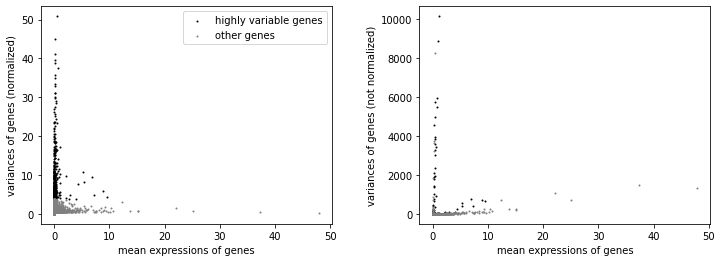

In [8]:
# compute variable genes
sc.pp.highly_variable_genes(combined, flavor='seurat_v3',n_top_genes=500)
print("Highly variable genes: {}".format(sum(combined.var.highly_variable)))

# plot variable genes
sc.pl.highly_variable_genes(combined)

CD62L,L-selectin: 'SELL', CD45: 'PTPRC', CD95:'FAS'

In [9]:
important_marker_genes = ['CD8A','CD8B','PTPRC','TBX21','CCR5','CXCR3','IL7','SELL','GATA3','CCR6','IL4','GZMB',
                          'PRF1','IL2RB','IL2RA','FOXP3','CD28','IL10','CD44','EOMES','IL17A','IL17B','IL17C','IL10','CD69'
                          'CD27','FAS','KLRG1','CCR7','GZMA','GZMH','GZMK','GZMM','GNYL','ENTPD1','TCF7','ITGAE','CTSW', 
                          'IFNG','CD161','TNFRSF4','TNFRSF18','NKG7','B3GAT1']

In [10]:
important_nonmarker_genes = ['CD4','CD68','CD163','MS4A2','CD14','CD16','XCL2','COL1A2','MMP2','ACTA2','CD79A',
                             'LAMP3','TPSAB1','PECAM1']

PD-1: 'PDCD1', TIM3:'HAVCR2'

In [11]:
exhaustion_markers = ['CXCL13','CTLA4','PDCD1','HAVCR2','TIGIT','BTLA','CD244','CD160','ICOS','LAG3']

CD137:'TNFRSF9', KI67:'MKI67'

In [12]:
proliferation_markers = ['TOP2A','MKI67','TNFRSF9'] 

In [13]:
#HLA_class1_genes = combined.var_names.str.startswith(('HLA-A','HLA-B','HLA-C','HLA-E','HLA-F','HLA-G'))
#HLA_class2_genes = combined.var_names.str.startswith(('HLA-DM','HLA-DQ','HLA-DO','HLA-DP','HLA-DR'))
#HLA_class1_genes = list(combined[:,HLA_class1_genes].var_names)
#HLA_class2_genes = list(combined[:,HLA_class2_genes].var_names)

In [14]:
important_genes = important_marker_genes + important_nonmarker_genes+exhaustion_markers+proliferation_markers

In [15]:
# filter out the TCR genes in case their idiosyncrasy skews the clustering 
selected = list(combined.var_names.str.startswith(("TRA","TRB","HLA")))
TCR_genes = set(combined[:,selected].var_names)
for gene in TCR_genes:
    combined.var['highly_variable'][gene] = False

In [16]:
# restore the genes in case they are filtered out, all genes (including top 200 and the important markers 
# are stored as highly variable)
for gene in important_genes:
    combined.var['highly_variable'][gene] = True

In [17]:
# combined.raw stores a scopy of the data at current stage
# we do this since we will trim genes and only use the top few hundreds for clustering, yet we want to retain all genes for
# differential expression purposes

In [18]:
combined.raw = combined
combined = combined[:, combined.var['highly_variable']]

## Regress out cell cycles

In [19]:
# Extract cell cycle genes 
cell_cycle_genes = [x.strip() for x in open('/work/cell_cycle_genes.txt')]

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in combined.var_names]

In [20]:
# compute gene scores for cell cycle genes which we will regress out
sc.tl.score_genes_cell_cycle(combined, s_genes=s_genes, g2m_genes=g2m_genes)

# regress out effects of total counts per cell and scale genes to have unit variance
sc.pp.regress_out(combined, ['total_counts', 'S_score', 'G2M_score'])

## PCA

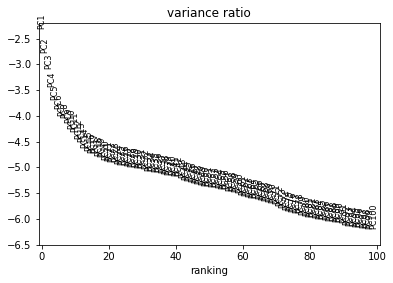

In [21]:
sc.pp.scale(combined, zero_center=False, max_value=10)

sc.tl.pca(combined, svd_solver='arpack',n_comps=100,use_highly_variable=True)
sc.pl.pca_variance_ratio(combined, log=True, n_pcs = 100)

In [22]:
save_file = '/scratch/PCA_decomposed_combined_samples.h5ad'
combined.write_h5ad(save_file)

# Dimension Reduction by Manifold Embedding

In [23]:
# bbknn is a batch correction algorithm that also computes neighbor graph
sc.external.pp.bbknn(combined, batch_key='bat', n_pcs=35)

In [24]:
# project to a 2-dimensional subspace, save to a new object so that the umap with 2D is not overwritten.
batch_corrected_umap = sc.tl.umap(combined, n_components=2, copy=True,min_dist=0.05)

In [25]:
# Leiden clustering
sc.tl.leiden(batch_corrected_umap)
# find marker genes
sc.tl.rank_genes_groups(batch_corrected_umap, groupby='leiden',method='wilcoxon')

In [26]:
# save file 
save_file = '/scratch/batch_corrected_umap.h5ad'
batch_corrected_umap.write_h5ad(save_file)

# The UMAP

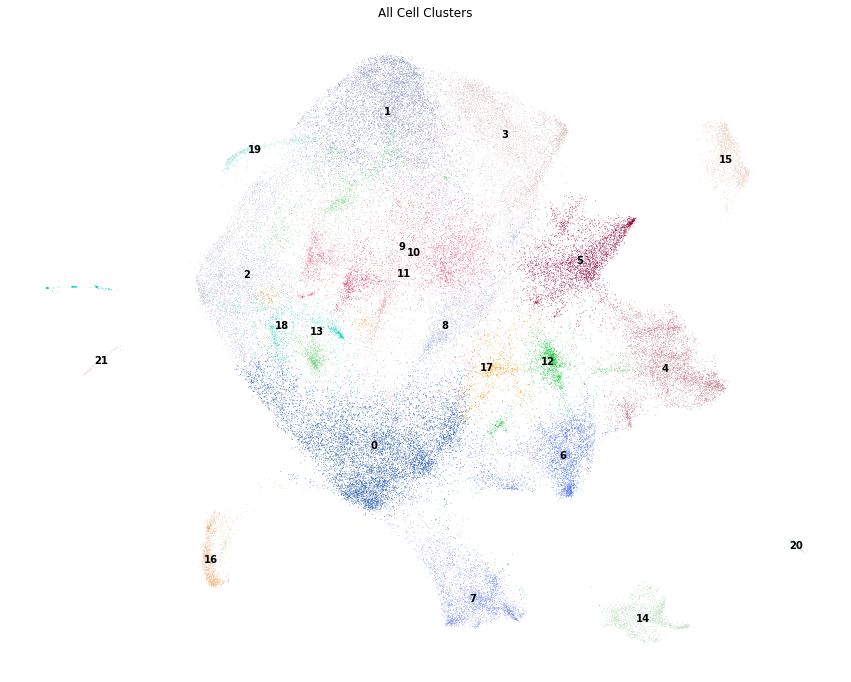

In [27]:
fig, ax = plt.subplots(figsize=(15,12))
sc.pl.umap(batch_corrected_umap, color='leiden', title='All Cell Clusters', legend_loc='on data',frameon=False,ax=ax)

# QC and Sanity-check

### UMAP Visualization by Batches

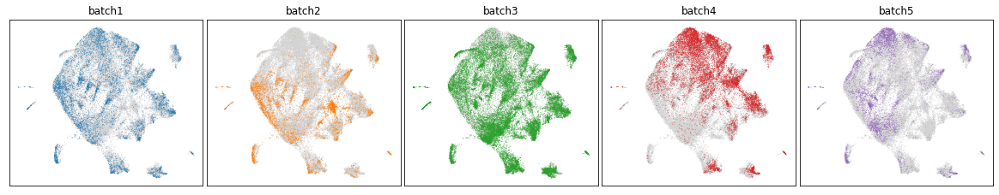

In [28]:
n_batch = len(set(batch_corrected_umap.obs['bat']))
batch = ['batch'+str(i) for i in range(1,n_batch+1)]
fig, ax = plt.subplots(1, n_batch,sharex=True,gridspec_kw={'width_ratios': [1]*n_batch}, figsize=(16,3))

for i in range(n_batch):
    sc.pl.umap(batch_corrected_umap, color='bat', groups=batch[i],ax=ax[i],show=False)
    ax[i].get_legend().remove()
    ax[i].set_title(batch[i])
    ax[i].xaxis.label.set_visible(False)
    ax[i].yaxis.label.set_visible(False)
plt.tight_layout(pad=0.1)
plt.show()

### UMAP Visualization of all samples together

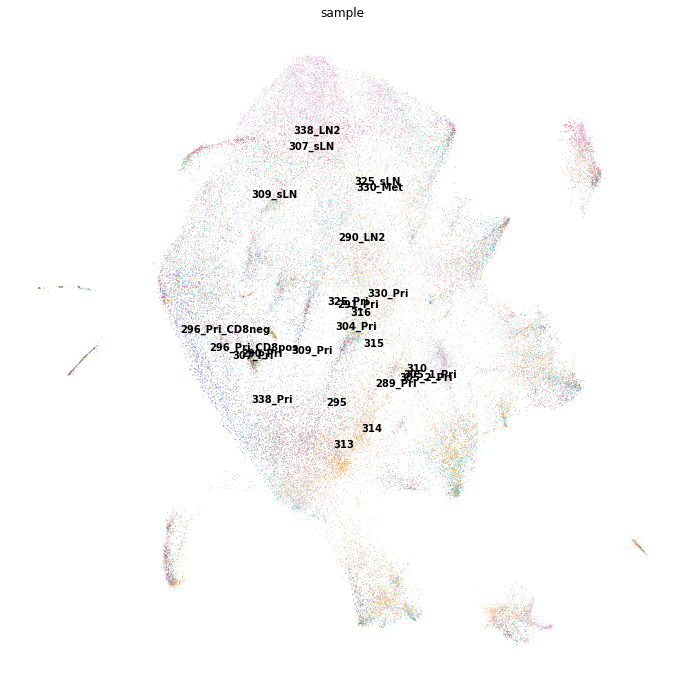

In [29]:
fig, ax = plt.subplots(figsize=(12,12))
sc.pl.umap(batch_corrected_umap, color='sample',legend_loc='on data',frameon=False,ax=ax)
ax.set_title("All Samples")
plt.show()

### UMAP Visualization by Samples

In [30]:
dataset_names =['289_Pri','290_Pri','295','296_Pri_CD8pos','305_1_Pri','307_Pri','309_Pri','310','314',
                '316','290_LN2','291_Pri','296_Pri_CD8neg','304_Pri','305_2_Pri','307_sLN','309_sLN',
                '313','315','325_Pri','325_sLN','330_Pri','330_Met']

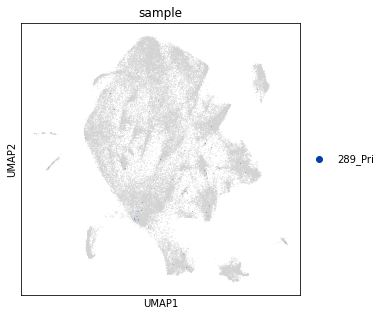

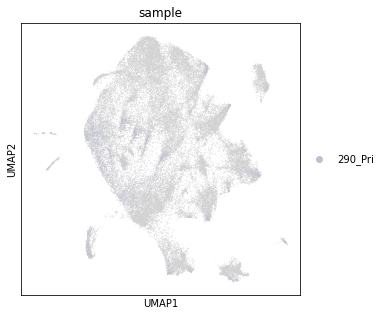

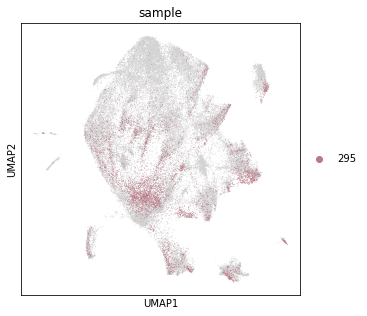

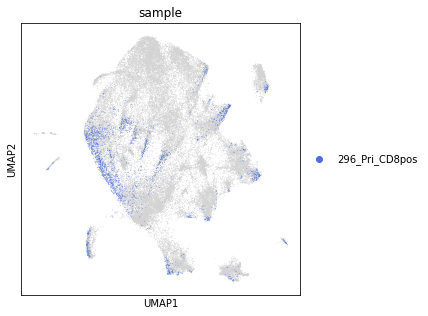

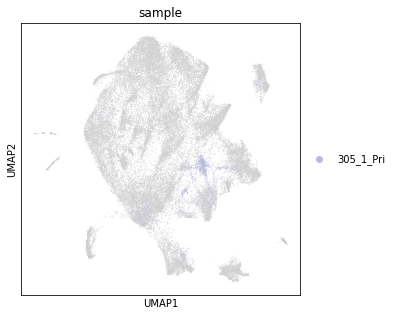

...

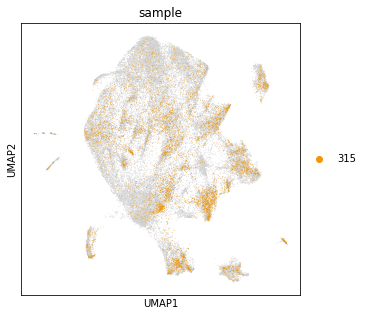

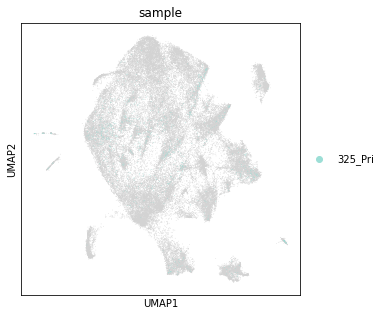

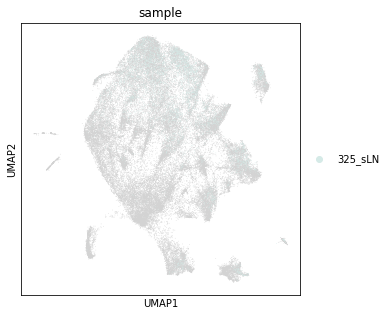

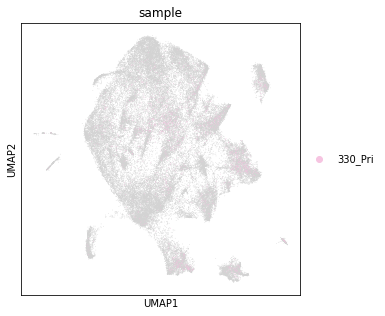

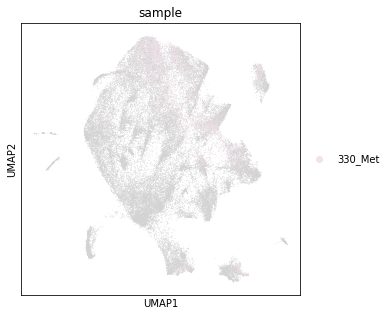

In [31]:
for sample in dataset_names:
    fig, ax = plt.subplots(figsize=(5,5))
    sc.pl.umap(batch_corrected_umap, color='sample', groups=[sample], ax=ax)
    ax.get_legend().remove()
    ax.set_title('Sample '+sample)
    plt.show()

### TCR-genes and CD3 Distribution on UMAP (QC and Sanity Check)

For 289_Pri


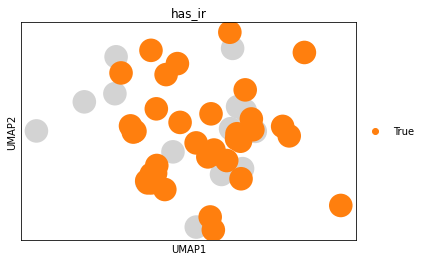

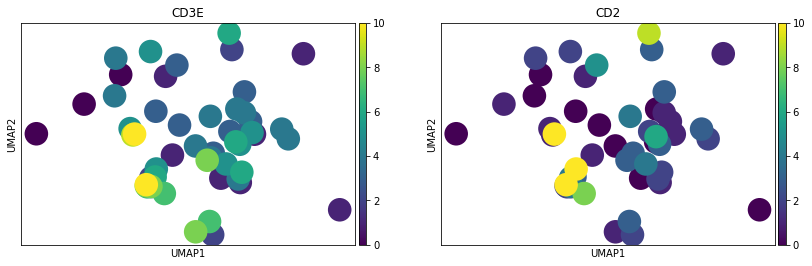

For 290_Pri


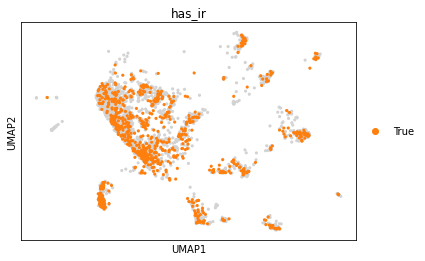

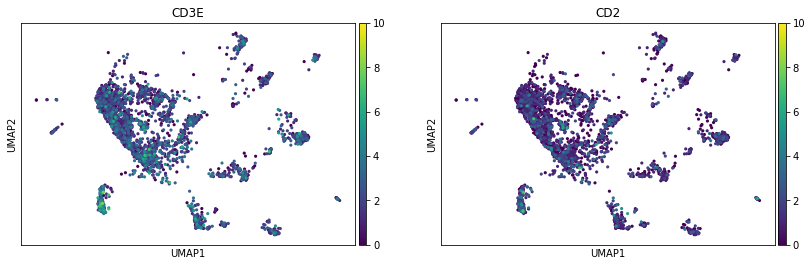

For 295


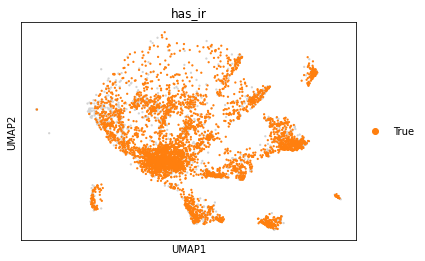

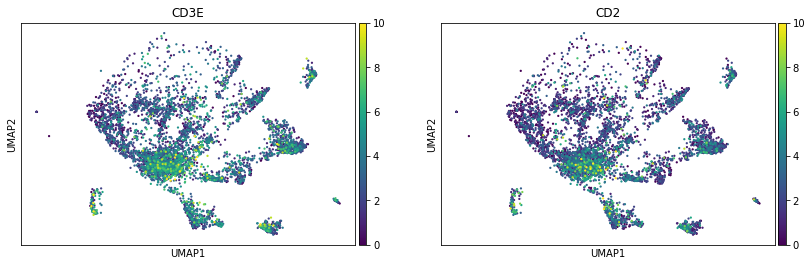

For 296_Pri_CD8pos


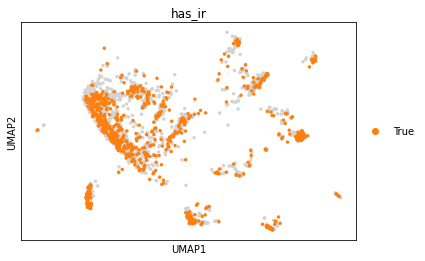

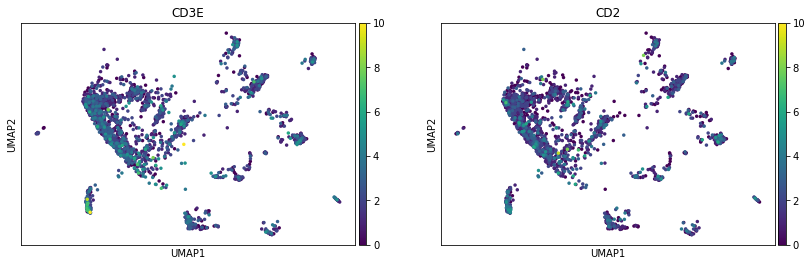

For 305_1_Pri


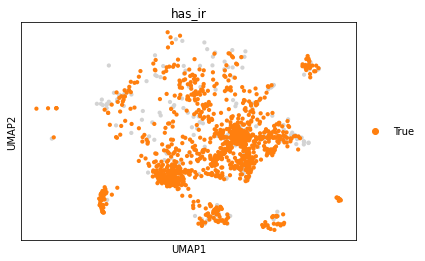

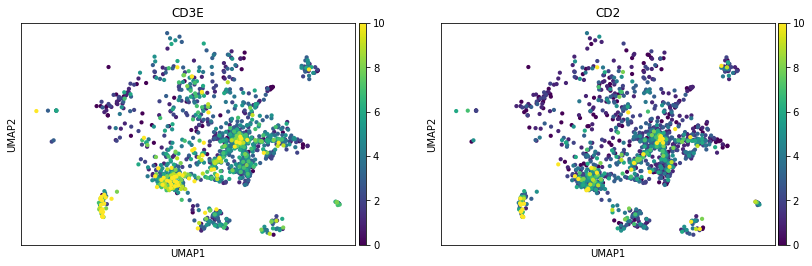

For 307_Pri


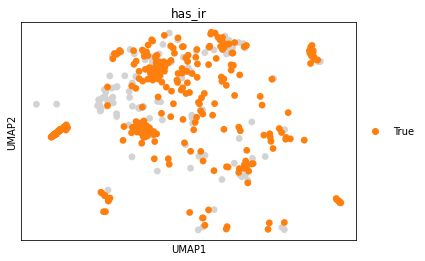

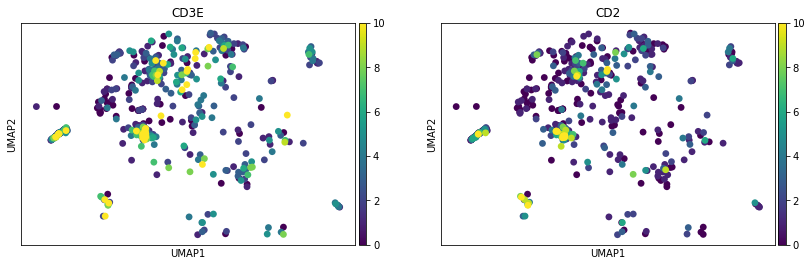

For 309_Pri


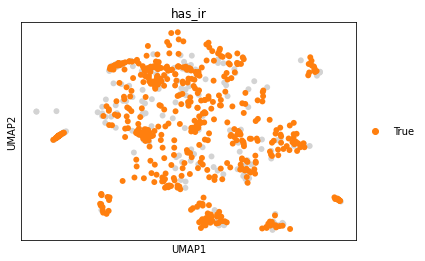

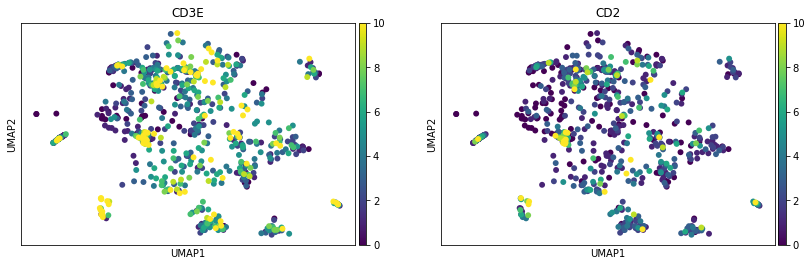

For 310


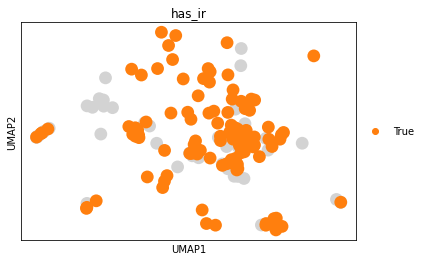

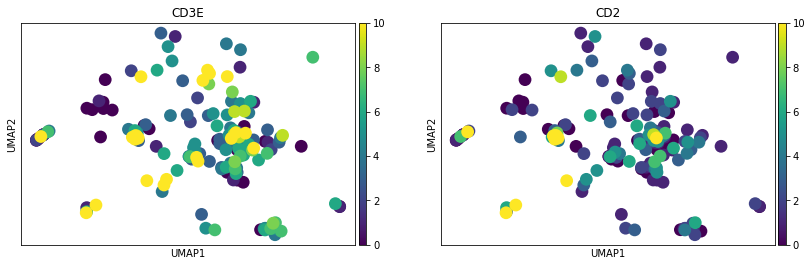

For 314


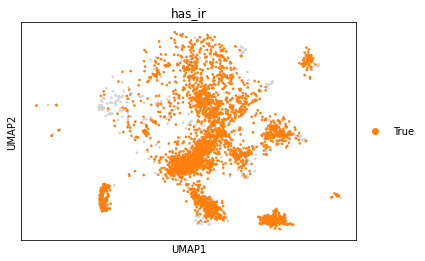

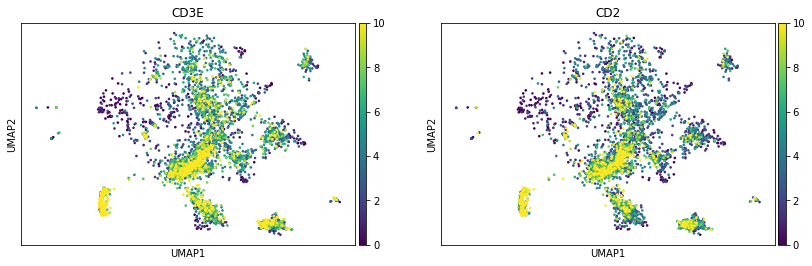

For 316


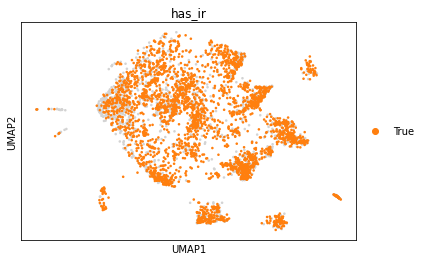

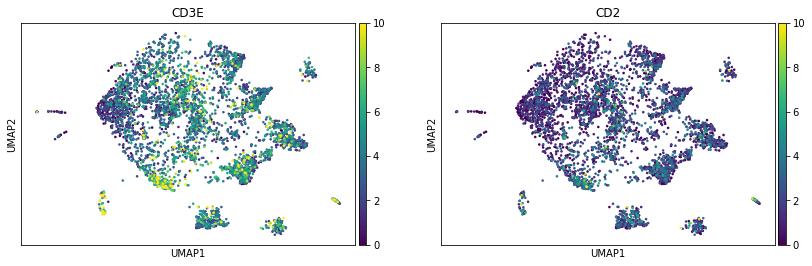

For 290_LN2


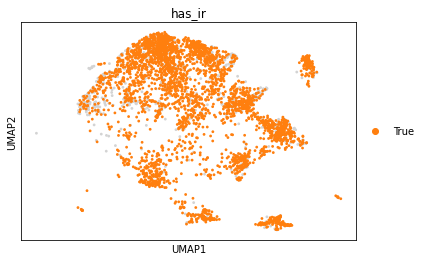

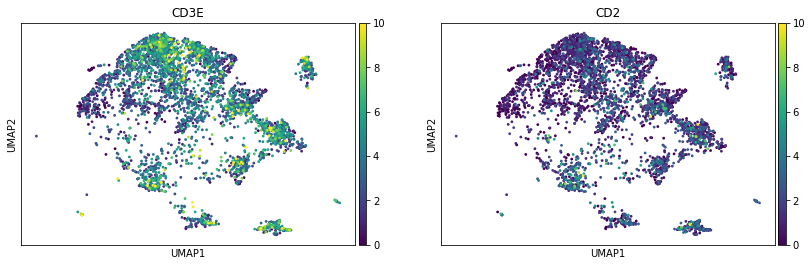

For 291_Pri


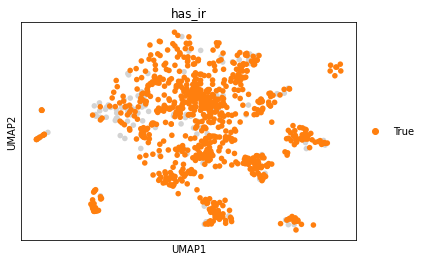

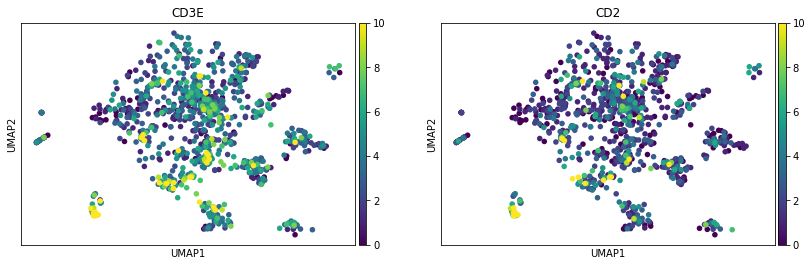

For 296_Pri_CD8neg


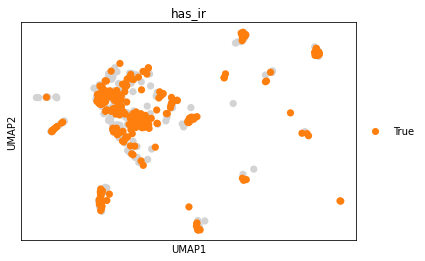

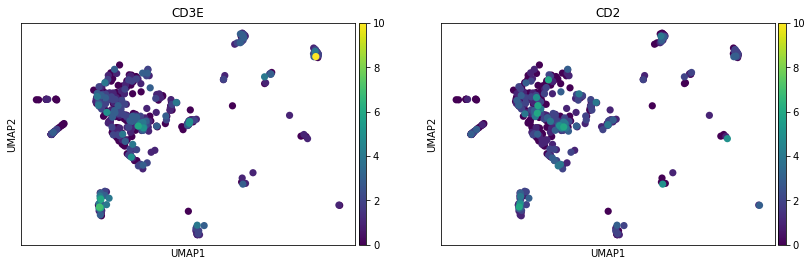

For 304_Pri


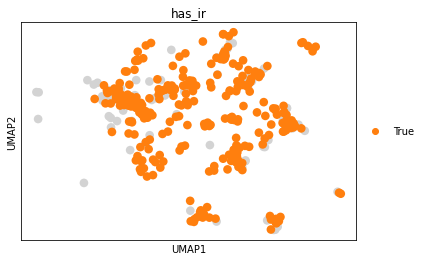

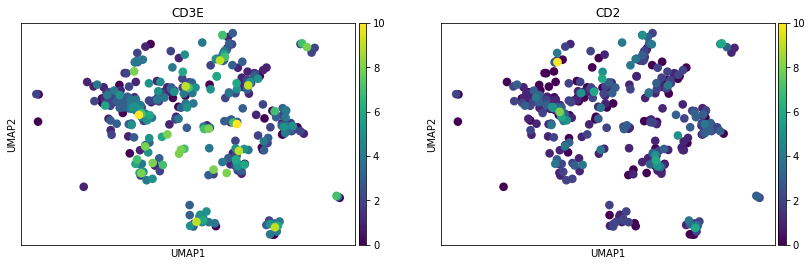

For 305_2_Pri


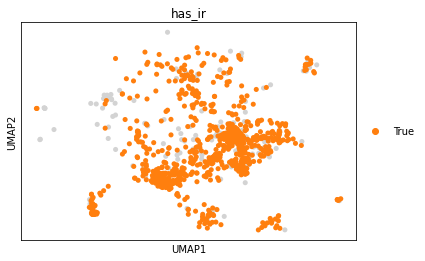

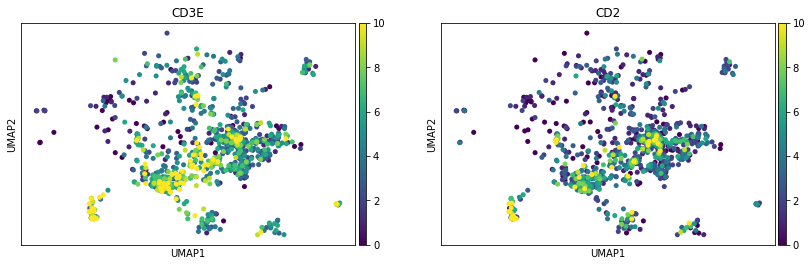

For 307_sLN


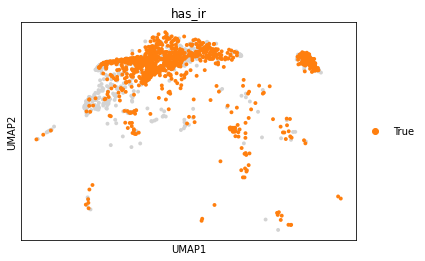

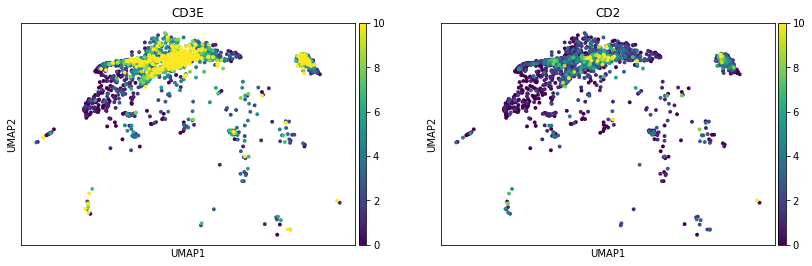

For 309_sLN


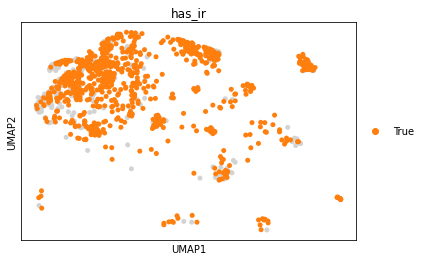

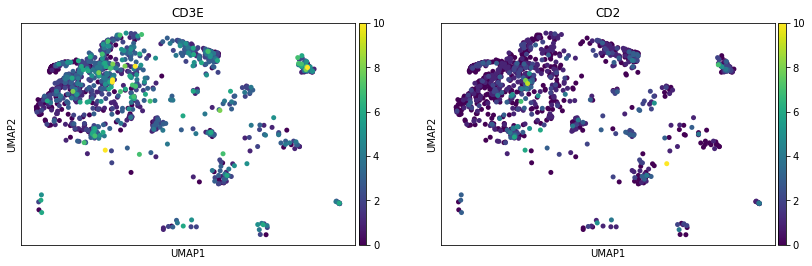

For 313


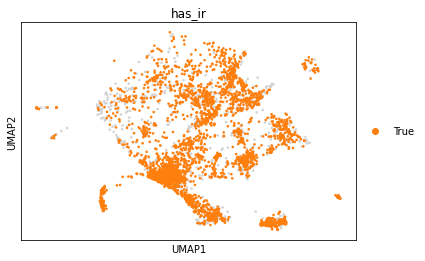

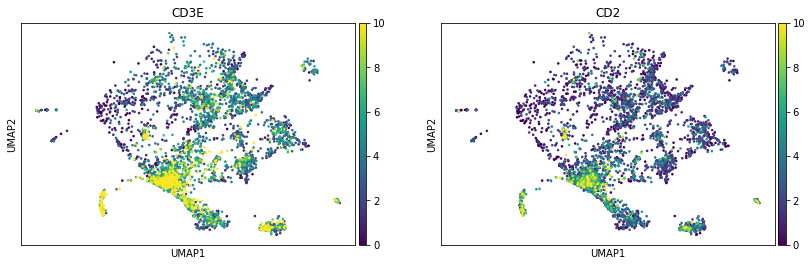

For 315


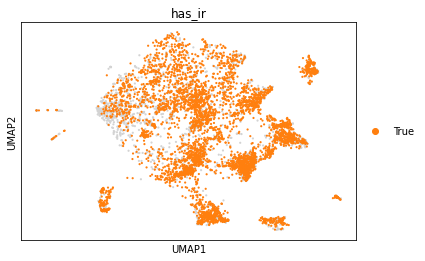

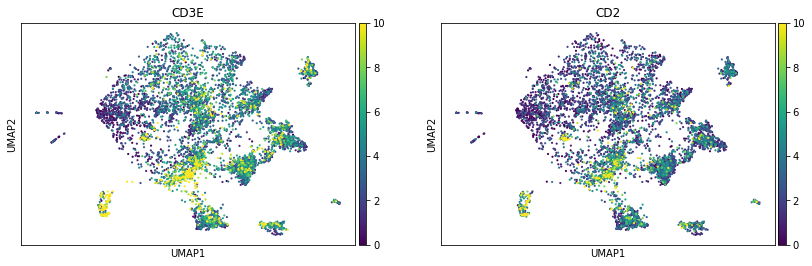

For 325_Pri


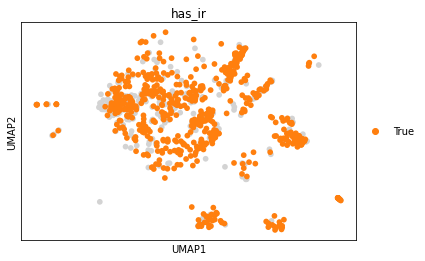

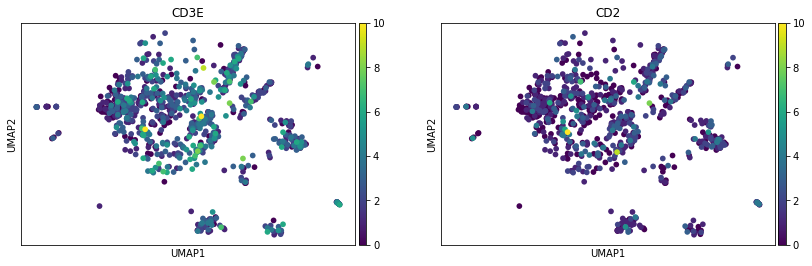

For 325_sLN


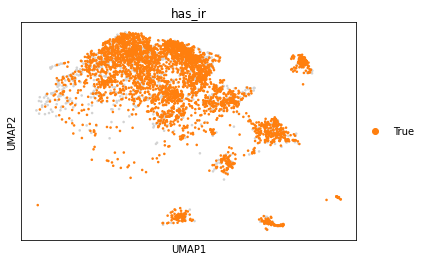

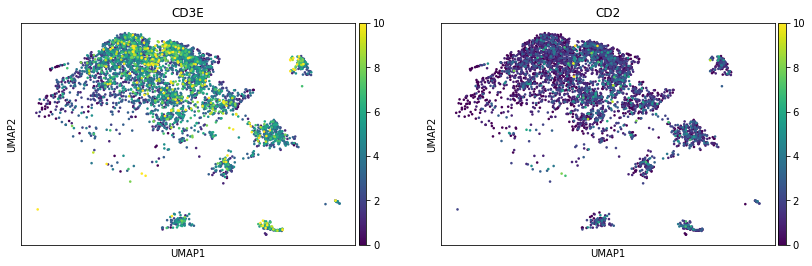

For 330_Pri


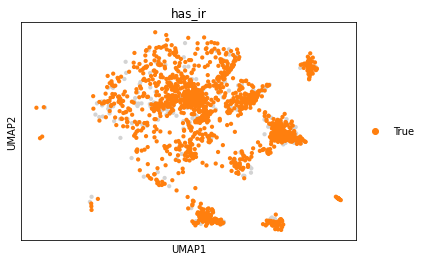

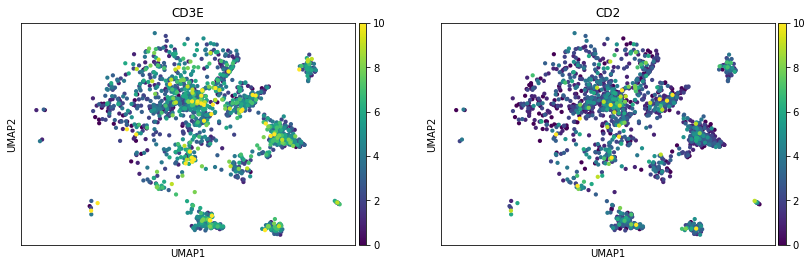

For 330_Met


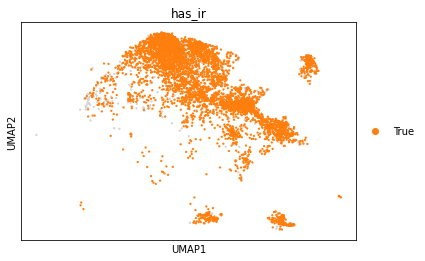

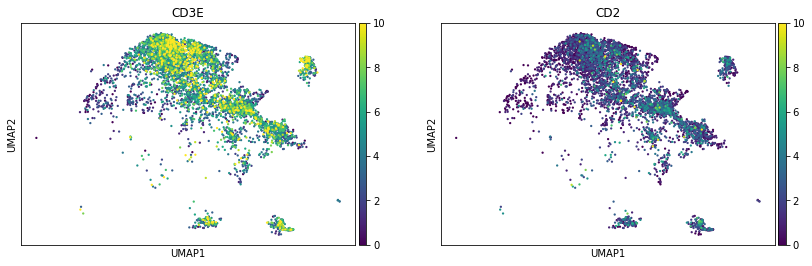

For 338_Pri


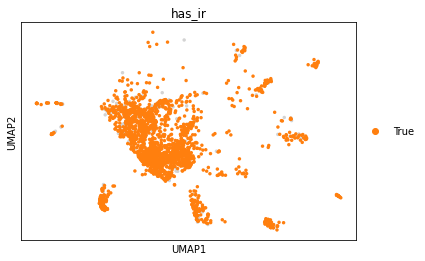

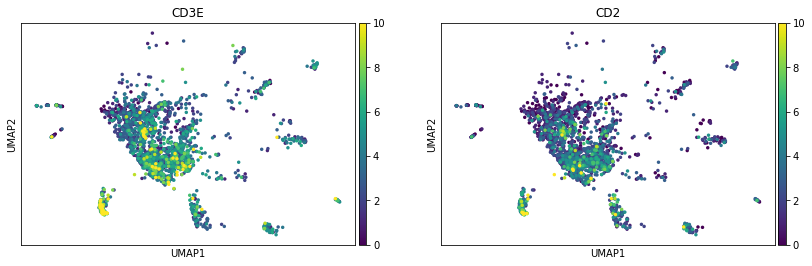

For 338_LN2


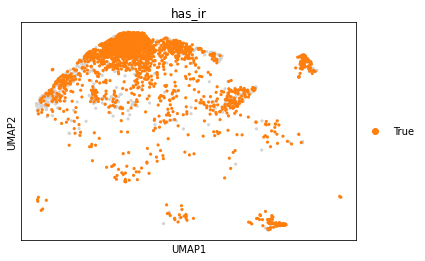

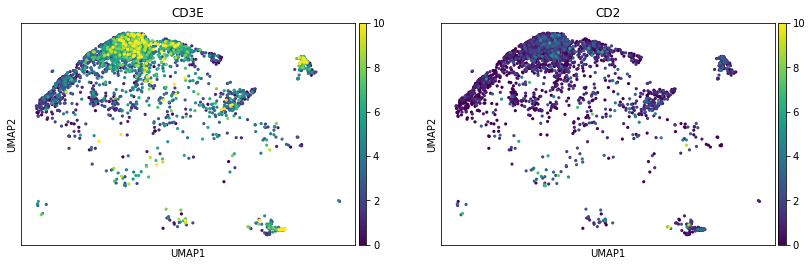

In [32]:
datasets =['289_Pri','290_Pri','295','296_Pri_CD8pos','305_1_Pri','307_Pri','309_Pri','310','314','316',
                '290_LN2','291_Pri','296_Pri_CD8neg','304_Pri','305_2_Pri','307_sLN','309_sLN','313','315',
                '325_Pri', '325_sLN', '330_Pri', '330_Met','338_Pri','338_LN2']

for dataset in datasets:
    print('For '+dataset)
    sc.pl.umap(batch_corrected_umap[batch_corrected_umap.obs['sample']==dataset],color=['has_ir'],groups='True')
    sc.pl.umap(batch_corrected_umap[batch_corrected_umap.obs['sample']==dataset],color=['CD3E','CD2'],vmax=10)

### UMAP Visualization by Tissue Types

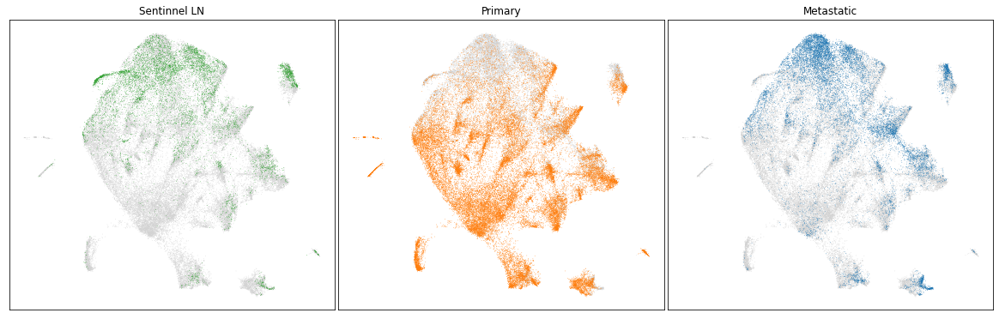

In [33]:
fig, ax = plt.subplots(1, 3,sharex=True,gridspec_kw={'width_ratios': [1, 1, 1]}, figsize=(16,5))
i=0
for g in set(batch_corrected_umap.obs['group']):
    sc.pl.umap(batch_corrected_umap, color='group',groups=[g],ax=ax[i],show=False)
    ax[i].get_legend().remove()
    ax[i].set_title(g)
    ax[i].xaxis.label.set_visible(False)
    ax[i].yaxis.label.set_visible(False)
    
    i += 1

plt.tight_layout(pad=0.1)
plt.show()

### UMAP Visualization by Cell-cycles

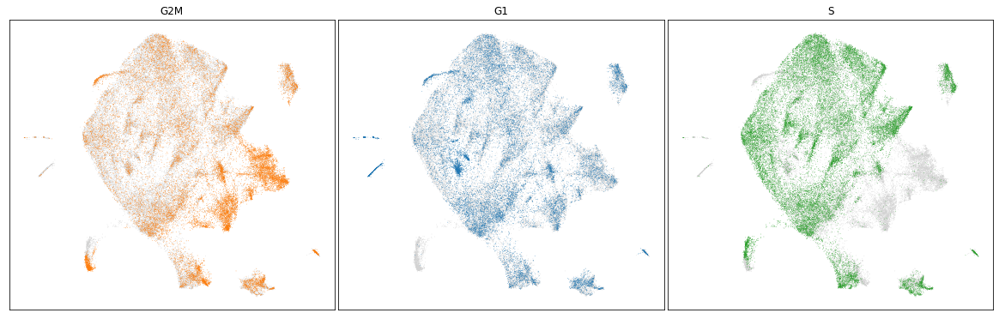

In [34]:
fig, ax = plt.subplots(1, 3,sharex=True,gridspec_kw={'width_ratios': [2, 2, 2]}, figsize=(16,5))
i = 0
for g in set(batch_corrected_umap.obs['phase']):
    sc.pl.umap(batch_corrected_umap, color='phase', groups=[g],ax=ax[i],show=False)
    ax[i].get_legend().remove()
    ax[i].xaxis.label.set_visible(False)
    ax[i].yaxis.label.set_visible(False)
    ax[i].set_title(g)
    i += 1
plt.tight_layout(pad=0.1)
plt.show()

# Expression of Chosen Genes

### Expression of CD4, CD8, CD45, CD19 and CD56 

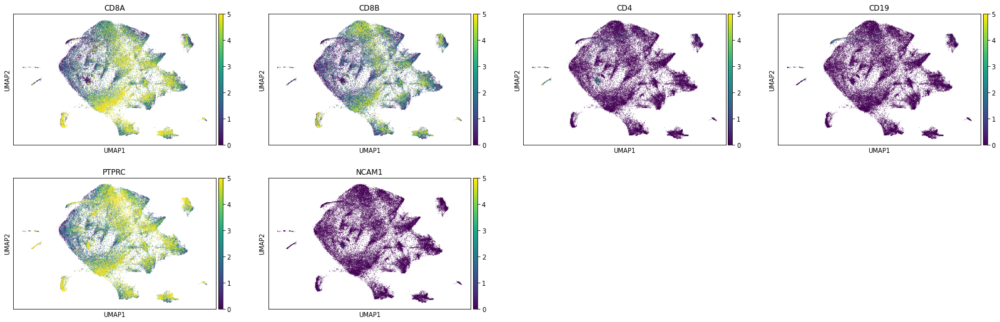

In [35]:
sc.pl.umap(batch_corrected_umap,color=['CD8A','CD8B','CD4','CD19','PTPRC','NCAM1'],use_raw=True,vmax=5)

### Expression of Exhaustion Markers

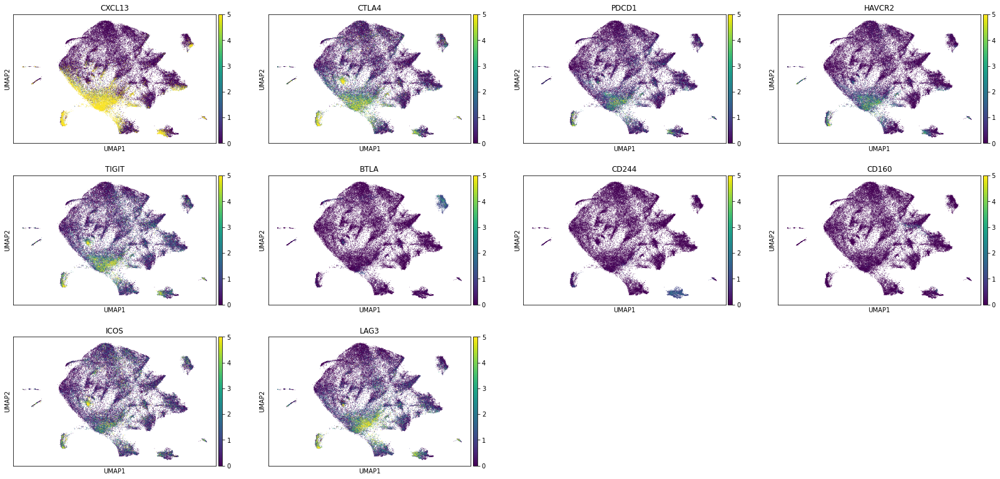

In [36]:
exhaustion_markers = ['CXCL13','CTLA4','PDCD1','HAVCR2','TIGIT','BTLA','CD244','CD160','ICOS','LAG3']
sc.pl.umap(batch_corrected_umap,color=exhaustion_markers,use_raw=True,vmax=5)

### Expression of Proliferation Markers

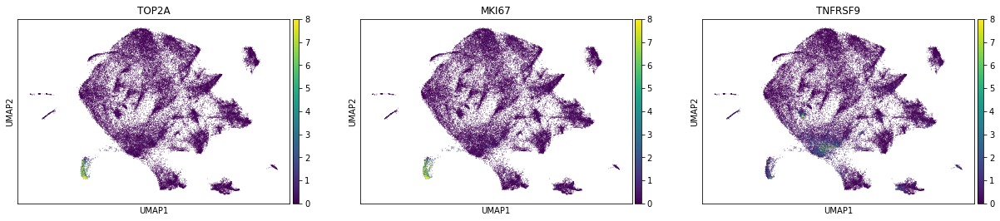

In [37]:
proliferation_markers = ['TOP2A','MKI67','TNFRSF9'] 
sc.pl.umap(batch_corrected_umap,color=proliferation_markers,vmax=8)

### Expression of  HLA Genes

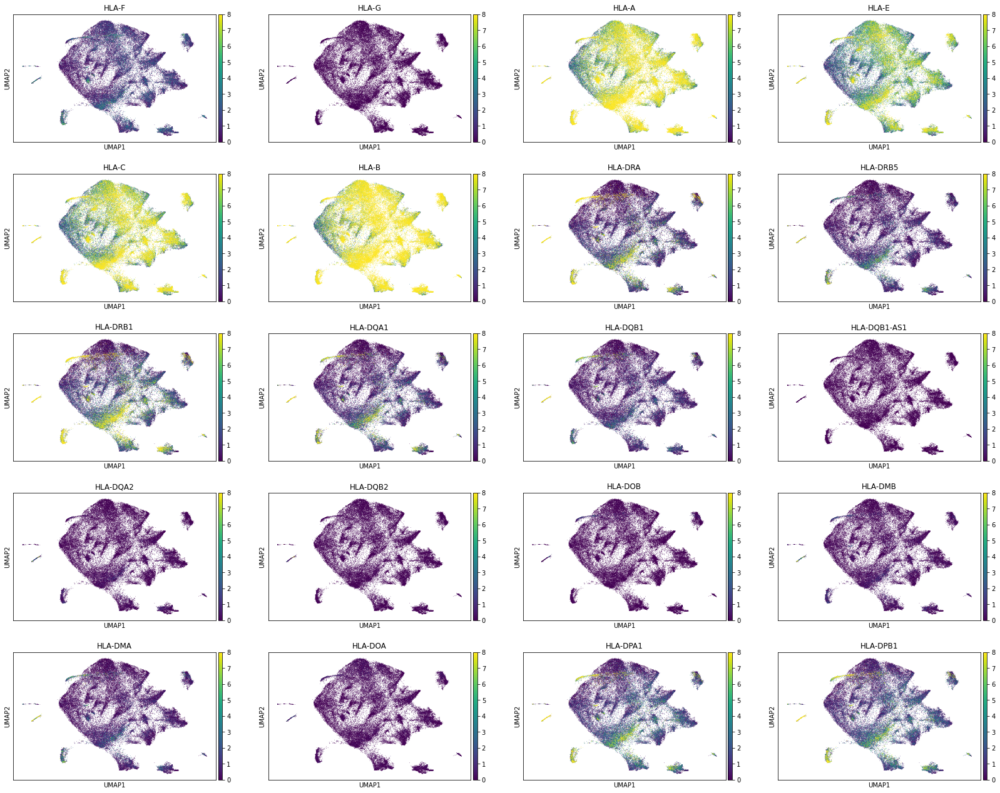

In [38]:
HLA_genes = ['HLA-F','HLA-G','HLA-A','HLA-E','HLA-C','HLA-B','HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1',
             'HLA-DQB1-AS1','HLA-DQA2','HLA-DQB2','HLA-DOB','HLA-DMB','HLA-DMA','HLA-DOA','HLA-DPA1','HLA-DPB1']
sc.pl.umap(batch_corrected_umap,color=HLA_genes,vmax=8)

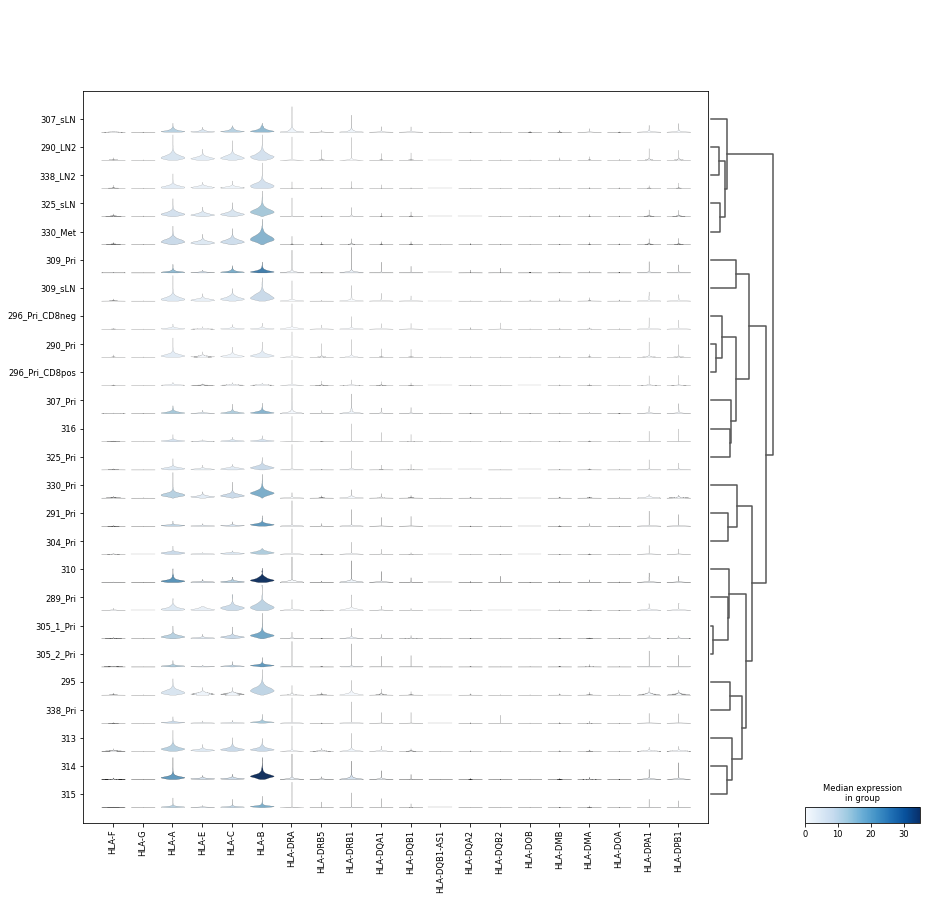

In [39]:
fig, ax = plt.subplots(figsize=(15,15))
sc.pl.stacked_violin(batch_corrected_umap, HLA_genes, groupby='sample', dendrogram=True, ax=ax)

### Expression of Extra Genes

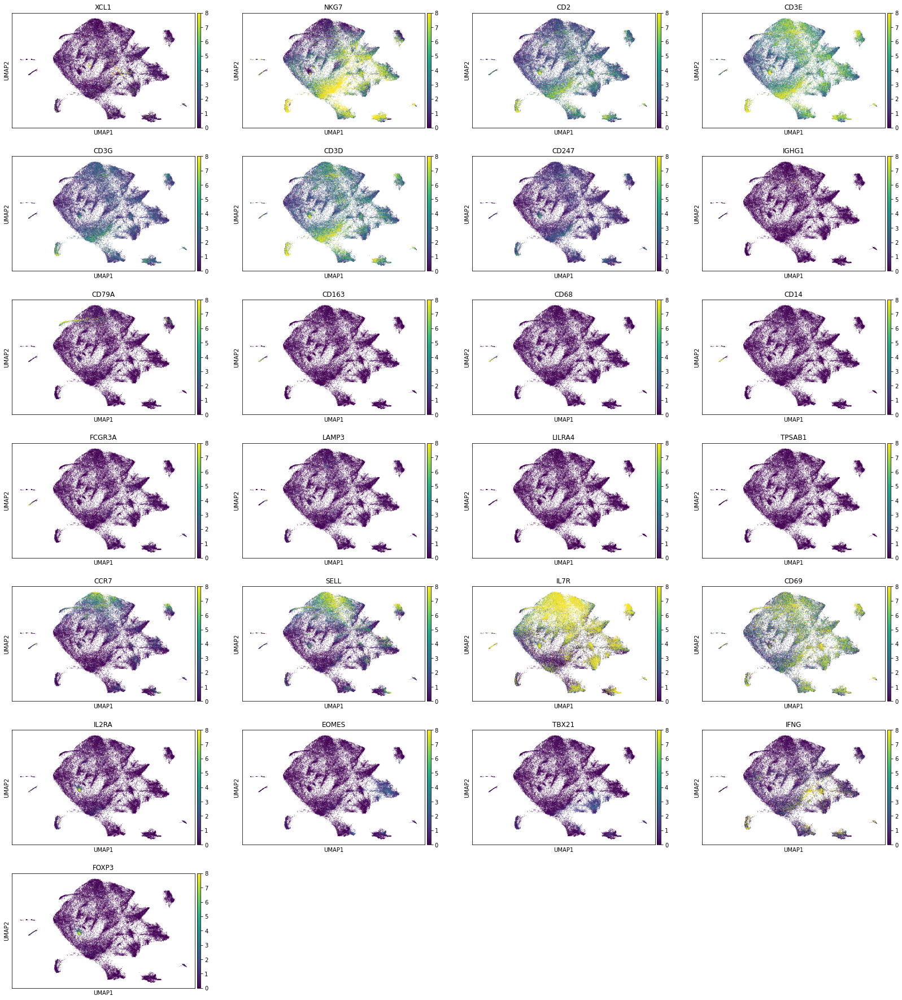

In [40]:
extra_genes = ['XCL1','NKG7','CD2','CD3E','CD3G','CD3D','CD247','IGHG1','CD79A','CD163','CD68','CD14','FCGR3A','LAMP3','LILRA4',
               'TPSAB1','CCR7','SELL','IL7R','CD69','IL2RA','EOMES','TBX21','IFNG','FOXP3']

sc.pl.umap(batch_corrected_umap,color=extra_genes,vmax=8)

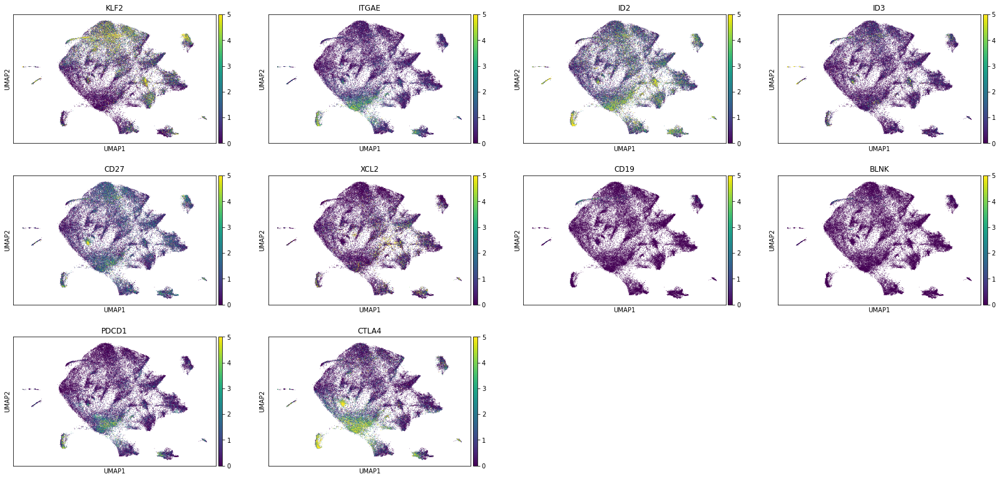

In [41]:
sc.pl.umap(batch_corrected_umap,color=['KLF2','ITGAE','ID2','ID3','CD27','XCL2','CD19','BLNK','PDCD1','CTLA4'],use_raw=True,vmax=5)

# Differential expression on all genes

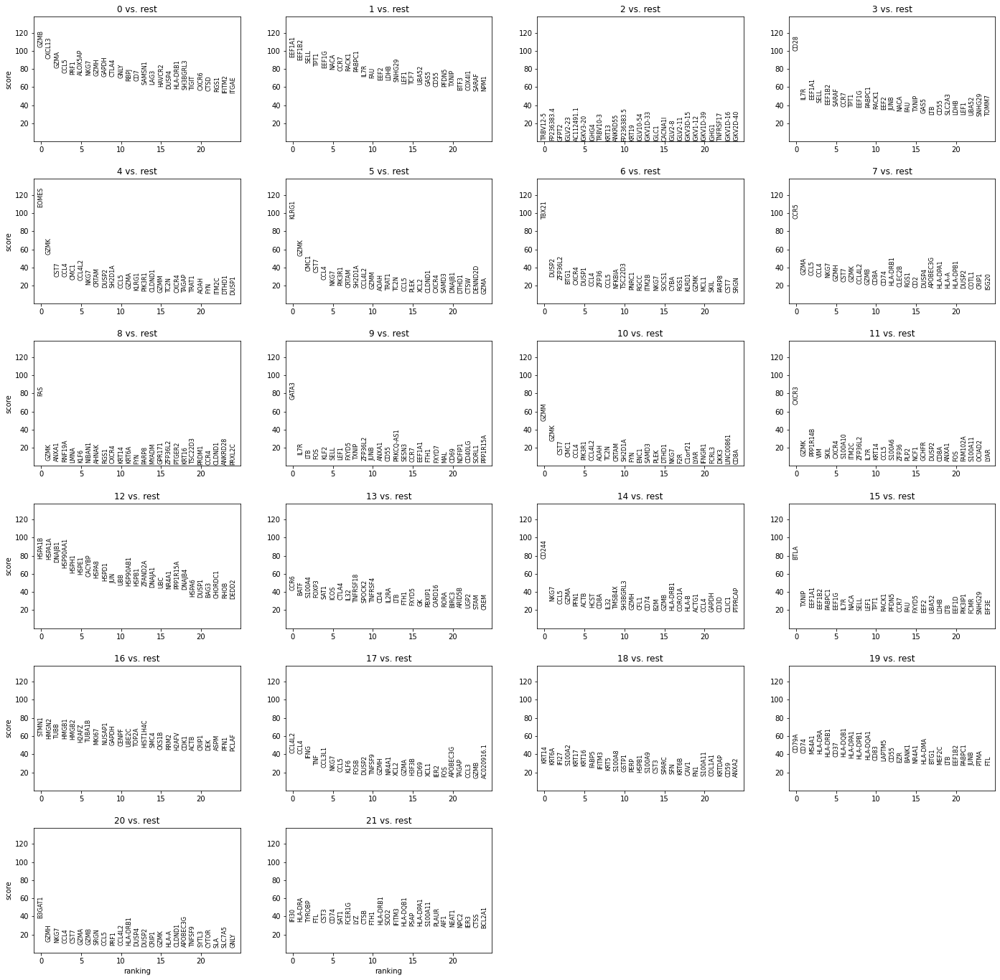

In [42]:
# find marker genes
sc.tl.rank_genes_groups(batch_corrected_umap, groupby='leiden',method='wilcoxon',use_faw=True)
sc.pl.rank_genes_groups(batch_corrected_umap,n_genes=25,use_raw=True)

!rm -f /scratch/cluster_genes_all.csv
cluster_marker_gene_file = '/scratch/cluster_genes_all.csv'
cluster_sizes = []
for i in range(len(set(batch_corrected_umap.obs['leiden']))):
    cluster_sizes.append(sum(batch_corrected_umap.obs['leiden']==str(i)))
    with open(cluster_marker_gene_file, 'a') as file:
        file_writer = csv.writer(file)
        file_writer.writerow(['Cluster'+str(i)+':',cluster_sizes[-1]])
        file_writer.writerow(batch_corrected_umap.uns['rank_genes_groups']['names'][str(i)][:30])
        file_writer.writerow(batch_corrected_umap.uns['rank_genes_groups']['logfoldchanges'][str(i)][:30])

# Cluster Annotation

In [43]:
cluster_number = copy.deepcopy(batch_corrected_umap.obs['leiden'])

In [44]:
# annotate the cells along trajectory
cluster_annotations = ['Dysfunctional T', '(Naive T)_1', 'Unknown','(Naive T)_2', 'Activated CTL', '(Memory T)_1',
                       '(Memory)_2','Highly Activated CTL', 'Early-mid activated T', '(Transitional)_1','(Transitional)_2',
                       '(Transitional)_3','(Transitional)_4','Treg','CD244+ T','BTLA+ T',
                       'Proliferating T', 'Pre-dysfunctional','Epithelial&Fibroblast','B',
                       'senescent T', 'Myeloid']

In [45]:
# we duplicate the cluster numbering for easy exportation to TSCAN
batch_corrected_umap.obs['leiden_number'] = cluster_number
# annotate the clusters by renaming the leiden clusters
batch_corrected_umap.rename_categories('leiden', cluster_annotations)

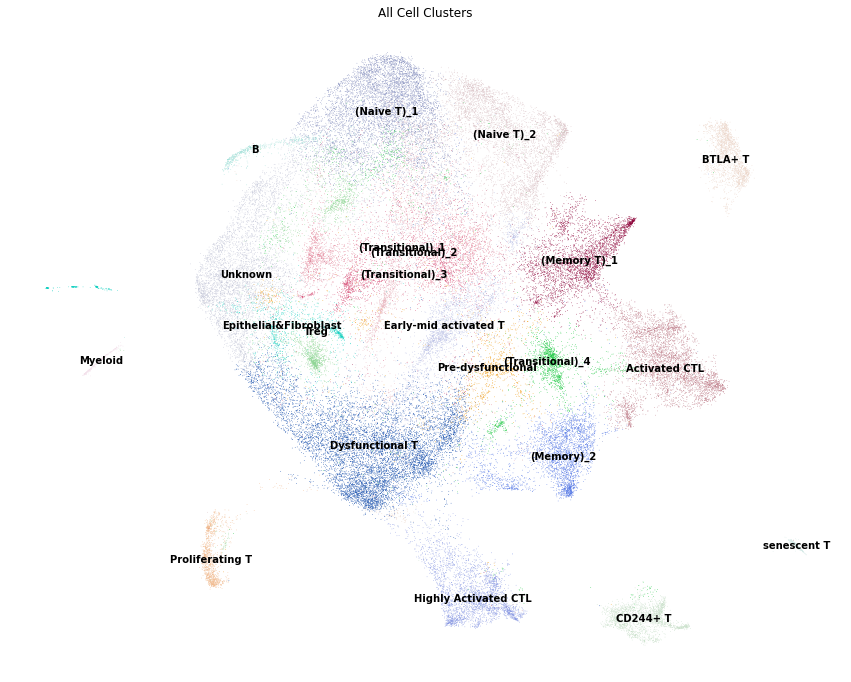

In [46]:
fig, ax = plt.subplots(figsize=(15,12))
sc.pl.umap(batch_corrected_umap, color='leiden', title='All Cell Clusters', legend_loc='on data',frameon=False,ax=ax)

In [47]:
save_file = '/scratch/annotated_umap.h5ad'
batch_corrected_umap.write_h5ad(save_file)